**IMPORT LIBRARIES**

In [ ]:
import os
import cv2
import json
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from skimage.feature import hog
from sklearn.tree import plot_tree

**PREPARE DATA**

In [2]:
def load_annotations(json_file):
    with open(json_file, 'r') as f:
        coco_data = json.load(f)
    return coco_data

def get_annotations_for_dataset(coco_data, image_dir):
    annotations = []
    for image_info in coco_data['images']:
        image_id = image_info['id']
        file_name = image_info['file_name']
        image_path = os.path.join(image_dir, file_name)
        image_annotations = [ann for ann in coco_data['annotations'] if ann['image_id'] == image_id]
        annotations.append((image_path, image_annotations))
    return annotations

**PREPROCESS DATA**

In [3]:
def adaptive_thresholding(image):
    # Chuyển ảnh sang không gian màu xám (grayscale)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Áp dụng Adaptive Thresholding
    segmented_image = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2
    )
    return segmented_image

In [4]:
# Trích xuất đặc trưng từ bounding box bằng HOG 
def extract_features_with_hog(image, bbox):
    x, y, w, h = [int(coord) for coord in bbox]
    cropped = image[y:y+h, x:x+w]
    resized = cv2.resize(cropped, (64, 64))  # Chuẩn hóa kích thước
    
    if len(resized.shape) == 3:  # 3 kênh (RGB hoặc BGR)
        gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
    else:
        gray = resized 

    # Thiết lập tham số HOG
    features, hog_image = hog(
        gray,
        orientations=9,         # Số lượng hướng gradient
        pixels_per_cell=(8, 8), # Kích thước mỗi ô (cell)
        cells_per_block=(2, 2), # Số lượng ô trong mỗi khối (block)
        block_norm='L2-Hys',    # Chuẩn hóa khối
        visualize=True          # Trả về ảnh HOG
    )
    return features

In [5]:
# Chuẩn bị dữ liệu huấn luyện và kiểm thử 
def prepare_dataset(annotation_data):
    X, y = [], []
    for image_path, anns in annotation_data:
        image = cv2.imread(image_path)
        segmented_image = adaptive_thresholding(image)
        for ann in anns:
            bbox = ann['bbox']
            category_id = ann['category_id']
            features = extract_features_with_hog(segmented_image, bbox)
            X.append(features)
            y.append(category_id)
    return np.array(X), np.array(y)

**TRAIN AND EVALUATE MODEL**

In [6]:
def train_svm(X_train, y_train):
    svm = SVC(kernel='rbf', probability=True, gamma='scale', C=100)
    svm.fit(X_train, y_train)
    return svm

In [7]:
def train_rf(X_train, y_train):
    model = RandomForestClassifier(n_estimators=150, max_depth=7, min_samples_split=2, min_samples_leaf=1, random_state=42, class_weight='balanced')
    model.fit(X_train, y_train)
    return model

In [8]:
def evaluate_model(model, X_test, y_test, id_to_label):
    
    y_pred = model.predict(X_test)

    # Đổi y_test và y_pred từ số sang tên
    y_test_labels = [id_to_label[y] for y in y_test]
    y_pred_labels = [id_to_label[y] for y in y_pred]

    # In báo cáo đánh giá
    print(classification_report(y_test_labels, y_pred_labels))
    print("Độ chính xác tổng thể:", accuracy_score(y_test, y_pred))

    # Tạo ma trận nhầm lẫn
    cm = confusion_matrix(y_test, y_pred, labels=list(id_to_label.keys()))
    labels = list(id_to_label.values())

    # Loại bỏ dòng và cột có nhãn là 's'
    s_index = labels.index('s') if 's' in labels else None
    if s_index is not None:
        # Xóa dòng và cột có nhãn 's' khỏi ma trận nhầm lẫn
        cm = np.delete(cm, s_index, axis=0)  # Xóa dòng
        cm = np.delete(cm, s_index, axis=1)  # Xóa cột
        labels = [label for label in labels if label != 's']  # Loại bỏ nhãn 's'

    # Vẽ ma trận nhầm lẫn
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()


**RESULT OF PREPROCESS ON SINGLE IMAGE**

[[255 255 255 ... 255   0   0]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ...   0   0 255]
 [  0   0   0 ...   0   0 255]
 [  0   0   0 ...   0   0 255]]


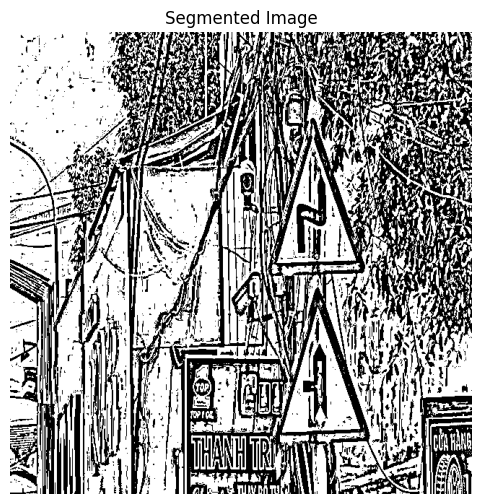

HOG Features: [0.30349341 0.15073927 0.11870577 0.0872067  0.26066722 0.07831089
 0.14420019 0.30349341 0.30349341 0.1697106 ]


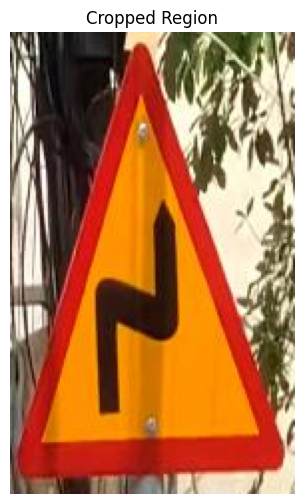

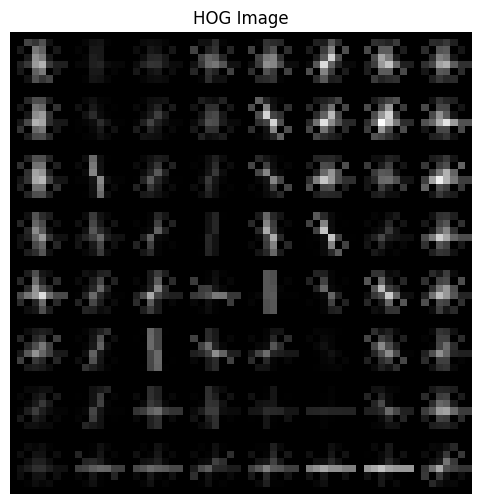

HOG Features: [0.22719302 0.12617374 0.05840341 0.13204435 0.17828367 0.10513965
 0.18037225 0.18267357 0.24414178 0.24414178]


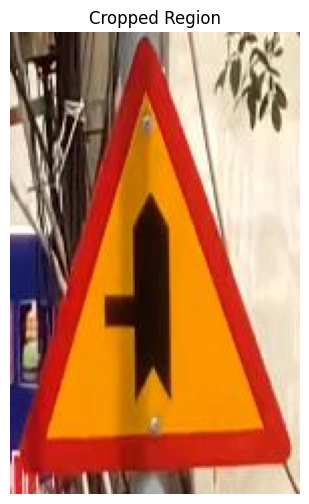

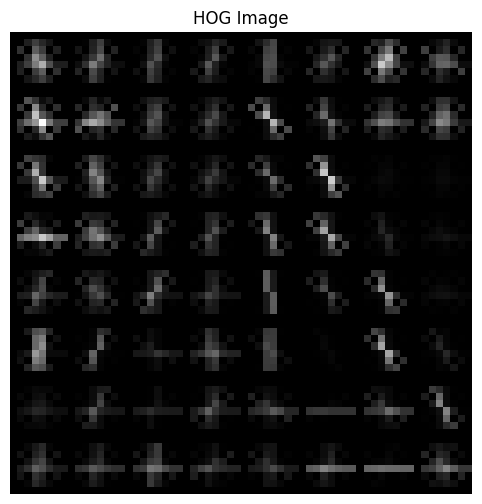

In [9]:
# --- Hàm hiển thị ảnh ---
def display_image(title, image, cmap=None):
    plt.figure(figsize=(10, 6))
    plt.title(title)
    if cmap:
        plt.imshow(image, cmap=cmap)
    else:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

image_path = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\valid\\IMG_4033-MOV_out0028_png.rf.1aa70a09b21fbe41198254d15e0bda71.jpg"  # Đường dẫn tới ảnh
annotation_data = [
    {
        "bbox": [
                354,
                114,
                143,
                232.5
            ]
    },
    {
        "bbox": [
                359,
                352,
                144,
                230.5
            ]
    }
]

image = cv2.imread(image_path)

segmented_image = adaptive_thresholding(image)
print(segmented_image)
display_image("Segmented Image", segmented_image)

# Trích xuất đặc trưng HOG từ bounding box
for ann in annotation_data:
    bbox = list(map(int, ann["bbox"]))  # Ép kiểu int cho từng giá trị trong bbox
    features = extract_features_with_hog(image, bbox)
    print("HOG Features:", features[:10])  # In 10 giá trị đầu tiên
    cropped = image[bbox[1]:bbox[1]+bbox[3], bbox[0]:bbox[0]+bbox[2]]
    display_image("Cropped Region", cropped)
    
    # Hiển thị ảnh HOG
    gray = cv2.cvtColor(cv2.resize(cropped, (64,64)), cv2.COLOR_BGR2GRAY)
    _, hog_image = hog(
        gray,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        block_norm='L2-Hys',
        visualize=True
    )
    display_image("HOG Image", hog_image, cmap="gray")


**OPTIMIZE PARAMETER**

In [10]:
def optimize_svm_hyperparameters(X_train, y_train):
    # Định nghĩa không gian tham số để tìm kiếm
    param_grid = {
        'C': [0.1, 1, 10, 100],        # Tham số điều chỉnh biên
        'kernel': ['linear', 'rbf'],   # Hàm kernel
        'gamma': ['scale', 'auto']     # Chỉ áp dụng với kernel RBF
    }
    
    # Khởi tạo mô hình SVM
    svm = SVC(probability=True)
    
    # Grid Search
    grid_search = GridSearchCV(
        svm, 
        param_grid, 
        cv=5,                # 5-fold cross-validation
        scoring='accuracy',  # Đo lường accuracy
        n_jobs=-1,           # Chạy song song với tất cả CPU
        verbose=1            # Hiển thị tiến trình
    )
    
    # Tìm kiếm tham số
    grid_search.fit(X_train, y_train)
    
    # Lấy tham số tốt nhất
    best_params = grid_search.best_params_
    print("Best Parameters:", best_params)
    
    # Trả về mô hình tốt nhất
    return grid_search.best_estimator_

"""
Best parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
"""


"\nBest parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}\n"

In [11]:
def optimize_rf_hyperparameters(X_train, y_train):
  # Các tham số mà bạn muốn tìm kiếm
  param_grid = {
      'n_estimators': [100, 120, 150],
      'max_depth': [5, 7],
      'min_samples_split': [2, 7, 10],
      'min_samples_leaf': [1, 2, 4, 7],
      'class_weight': ['balanced']  
  }

  # Tạo mô hình Random Forest
  rf_model = RandomForestClassifier(random_state=42)

  # Tạo GridSearchCV
  grid_search = GridSearchCV(estimator=rf_model,
                            param_grid=param_grid,
                            cv=5, 
                            n_jobs=-1,
                            verbose=2,
                            scoring='accuracy')

  # Thực hiện tìm kiếm trên tập huấn luyện (X_train và y_train)
  grid_search.fit(X_train, y_train)

  # Hiển thị các tham số tối ưu
  print("Best parameters:", grid_search.best_params_)
  print("Best score:", grid_search.best_score_)

"""
Best parameters: {'class_weight': 'balanced', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
"""

"\nBest parameters: {'class_weight': 'balanced', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}\n"

**MAIN FUNCTION**

In [12]:
# Đường dẫn tới dữ liệu
train_json = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\train\\final_annotations.coco.json"
valid_json = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\valid\\final_annotations.coco.json"
test_json = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\test\\final_annotations.coco.json"
train_dir = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\train"
valid_dir = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\valid"
test_dir = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\test"

# Đọc dữ liệu
train_data = load_annotations(train_json)
valid_data = load_annotations(valid_json)
test_data = load_annotations(test_json)

train_data

{'info': {'year': '2023',
  'version': '5',
  'description': 'Exported from roboflow.ai',
  'contributor': '',
  'url': 'https://public.roboflow.ai/object-detection/undefined',
  'date_created': '2023-06-01T08:17:38+00:00'},
 'licenses': [{'id': 1,
   'url': 'https://creativecommons.org/publicdomain/zero/1.0/',
   'name': 'Public Domain'}],
 'categories': [{'id': 0, 'name': 's', 'supercategory': 'none'},
  {'id': 1, 'name': 'P', 'supercategory': 'none'},
  {'id': 2, 'name': 'R', 'supercategory': 'none'},
  {'id': 3, 'name': 'S', 'supercategory': 'none'},
  {'id': 4, 'name': 'W', 'supercategory': 'none'},
  {'id': 5, 'name': 'I', 'supercategory': 'none'}],
 'images': [{'id': 0,
   'license': 1,
   'file_name': 'IMG_4122-MOV_out0059_png.rf.00178e4b0aec62e3b4dda84c194975c5.jpg',
   'height': 640,
   'width': 640,
   'date_captured': '2023-06-01T08:17:38+00:00'},
  {'id': 1,
   'license': 1,
   'file_name': 'IMG_4024-MOV_out0029_png.rf.000215575dc639e81987ec2a51933b9a.jpg',
   'height': 64

In [13]:
train_annotations = get_annotations_for_dataset(train_data, train_dir)
valid_annotations = get_annotations_for_dataset(valid_data, valid_dir)
test_annotations = get_annotations_for_dataset(test_data, test_dir)
    
train_annotations

[('C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\train\\IMG_4122-MOV_out0059_png.rf.00178e4b0aec62e3b4dda84c194975c5.jpg',
  [{'id': 0,
    'image_id': 0,
    'category_id': 1,
    'bbox': [227, 264, 37, 65.5],
    'area': 2423.5,
    'segmentation': [],
    'iscrowd': 0}]),
 ('C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\train\\IMG_4024-MOV_out0029_png.rf.000215575dc639e81987ec2a51933b9a.jpg',
  [{'id': 1,
    'image_id': 1,
    'category_id': 2,
    'bbox': [189, 261, 6.125, 11.125],
    'area': 68.141,
    'segmentation': [],
    'iscrowd': 0}]),
 ('C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\train\\IMG_4185-MOV_out0129_png.rf.001555bd37ce98ed848736e333921c24.jpg',
  []),
 ('C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\train\\IMG_4151-MOV_out0015_png.rf.004083a8921f6c7bcffb36a79de18605.jpg',
  [{'id': 2,
    'image_id': 3,
    'category_id': 1,
    'bbox': [182, 410, 37, 66.12

In [14]:
X_train, y_train = prepare_dataset(train_annotations)
X_valid, y_valid = prepare_dataset(valid_annotations)
X_test, y_test = prepare_dataset(test_annotations)

present_classes = set(y_train) | set(y_valid) | set(y_test)
id_to_label = {cat['id']: cat['name'] for cat in train_data['categories'] if cat['id'] in present_classes}

# rf = optimize_rf_hyperparameters(X_train, y_train)
rf = train_rf(X_train, y_train)

# svm = optimize_svm_hyperparameters(X_train, y_train)
svm = train_svm(X_train, y_train)

Báo cáo đánh giá (Valid):
              precision    recall  f1-score   support

           I       0.43      0.55      0.48        11
           P       0.97      0.88      0.92       740
           R       0.49      0.84      0.62       115
           S       0.89      0.57      0.70        14
           W       0.97      0.94      0.95       322

    accuracy                           0.89      1202
   macro avg       0.75      0.76      0.74      1202
weighted avg       0.92      0.89      0.90      1202

Độ chính xác tổng thể: 0.8868552412645591


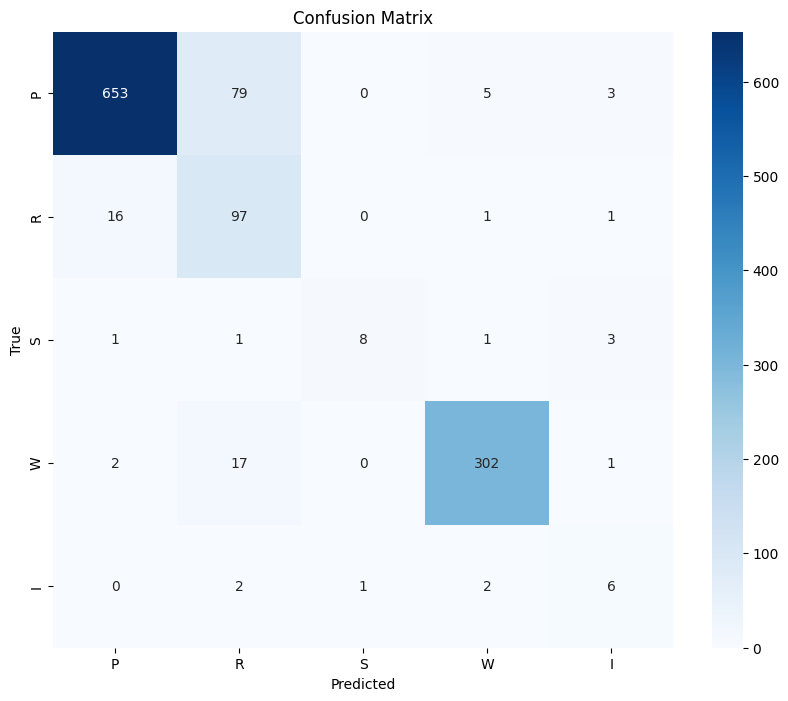

Báo cáo đánh giá (Test):
              precision    recall  f1-score   support

           I       0.50      0.57      0.53         7
           P       0.96      0.88      0.92       593
           R       0.53      0.81      0.64       110
           S       0.80      0.33      0.47        12
           W       0.95      0.94      0.94       220

    accuracy                           0.88       942
   macro avg       0.75      0.71      0.70       942
weighted avg       0.90      0.88      0.88       942

Độ chính xác tổng thể: 0.8779193205944799


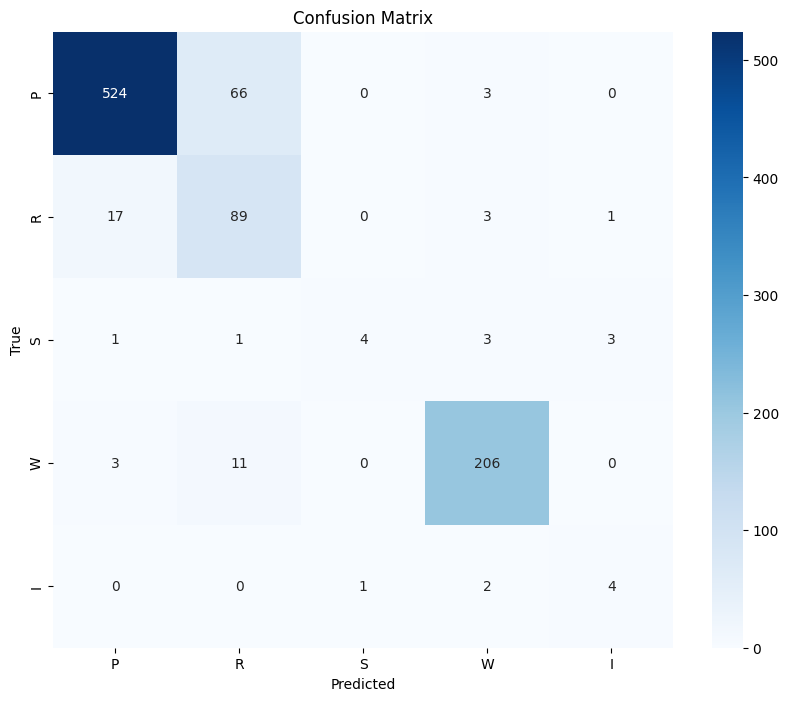

In [15]:
print("Báo cáo đánh giá (Valid):")
evaluate_model(rf, X_valid, y_valid, id_to_label)
print("Báo cáo đánh giá (Test):")
evaluate_model(rf, X_test, y_test, id_to_label)

Báo cáo đánh giá (Valid):
              precision    recall  f1-score   support

           I       0.67      0.55      0.60        11
           P       0.98      0.99      0.99       740
           R       0.97      0.92      0.95       115
           S       0.82      0.64      0.72        14
           W       0.98      0.98      0.98       322

    accuracy                           0.98      1202
   macro avg       0.88      0.82      0.85      1202
weighted avg       0.97      0.98      0.98      1202

Độ chính xác tổng thể: 0.9758735440931781


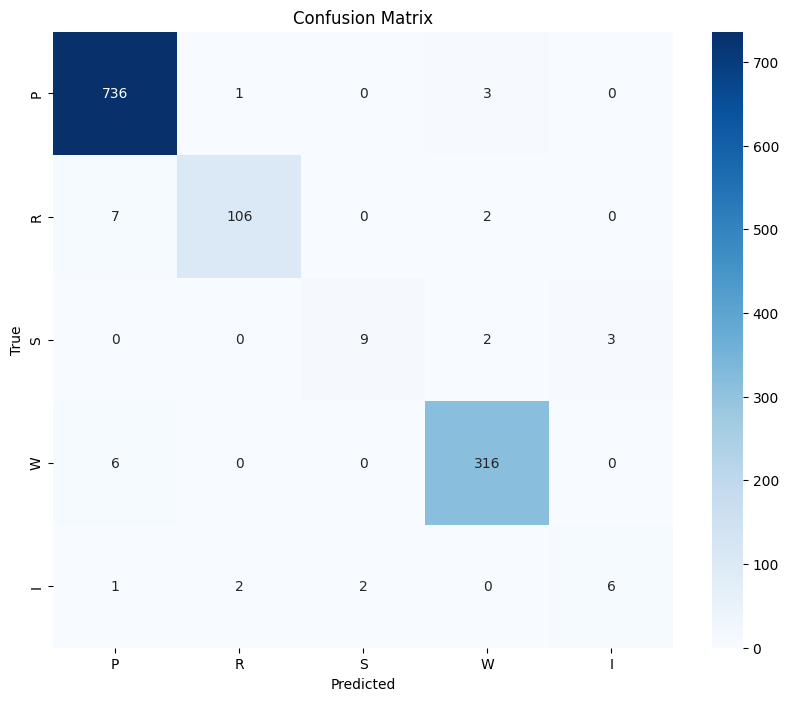

Báo cáo đánh giá (Test):
              precision    recall  f1-score   support

           I       0.50      0.57      0.53         7
           P       0.98      0.99      0.98       593
           R       0.94      0.88      0.91       110
           S       0.67      0.33      0.44        12
           W       0.97      0.98      0.98       220

    accuracy                           0.96       942
   macro avg       0.81      0.75      0.77       942
weighted avg       0.96      0.96      0.96       942

Độ chính xác tổng thể: 0.9639065817409767


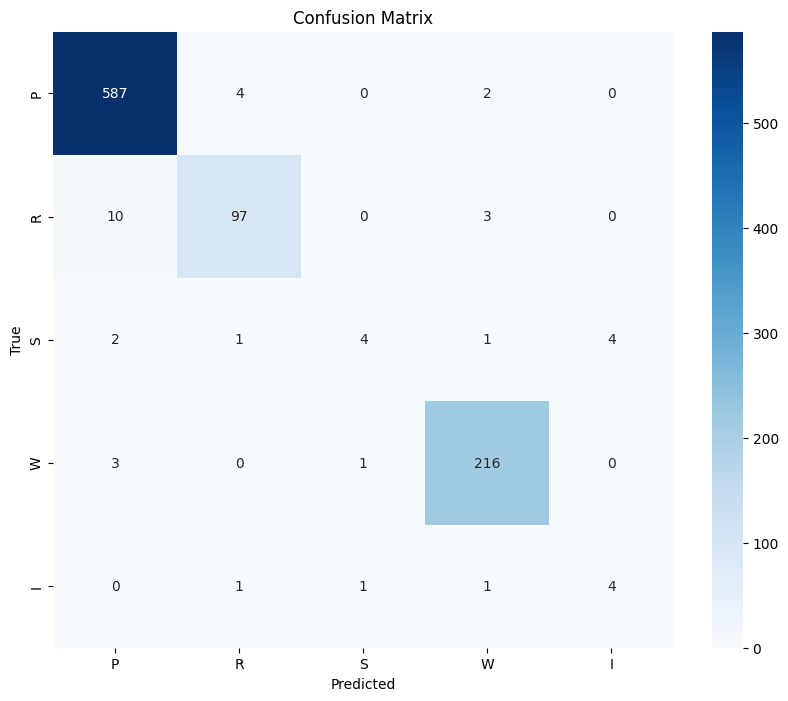

In [16]:
print("Báo cáo đánh giá (Valid):")
evaluate_model(svm, X_valid, y_valid, id_to_label)
print("Báo cáo đánh giá (Test):")
evaluate_model(svm, X_test, y_test, id_to_label)

In [17]:
# Dự đoán một vài ảnh không nằm trong dữ liệu có sẵn

def predict_new_images(model, images_dir, json_path, id_to_label):
    # Đọc file JSON
    with open(json_path, 'r') as f:
        data = json.load(f)

    # Duyệt qua từng ảnh trong JSON
    for image_info in data['images']:
        image_id = image_info['id']
        image_filename = image_info['file_name']
        image_path = os.path.join(images_dir, image_filename)

        # Đọc ảnh
        image = cv2.imread(image_path)
        if image is None:
            print(f"Không thể đọc ảnh: {image_path}")
            continue

        # Lọc annotations liên quan đến ảnh hiện tại
        anns = [ann for ann in data['annotations'] if ann['image_id'] == image_id]

        # Dự đoán từng bounding box trong ảnh
        predictions = []
        for ann in anns:
            bbox = ann['bbox']

            # Áp dụng phân đoạn màu
            segmented_image = adaptive_thresholding(image)

            # Trích xuất đặc trưng HOG
            features = extract_features_with_hog(segmented_image, bbox)

            # Dự đoán nhãn
            predicted_label = model.predict([features])[0]
            predictions.append((bbox, predicted_label))

        # Hiển thị ảnh với các bounding box và nhãn
        for bbox, pred_label in predictions:
            x, y, w, h = [int(coord) for coord in bbox]
            cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Khung màu xanh
            text = f"Pred: {id_to_label[pred_label]}"
            cv2.putText(image, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)

        # Chuyển ảnh về RGB để hiển thị với matplotlib
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Hiển thị ảnh
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(f"Image: {image_filename}")
        plt.axis("off")
        plt.show()

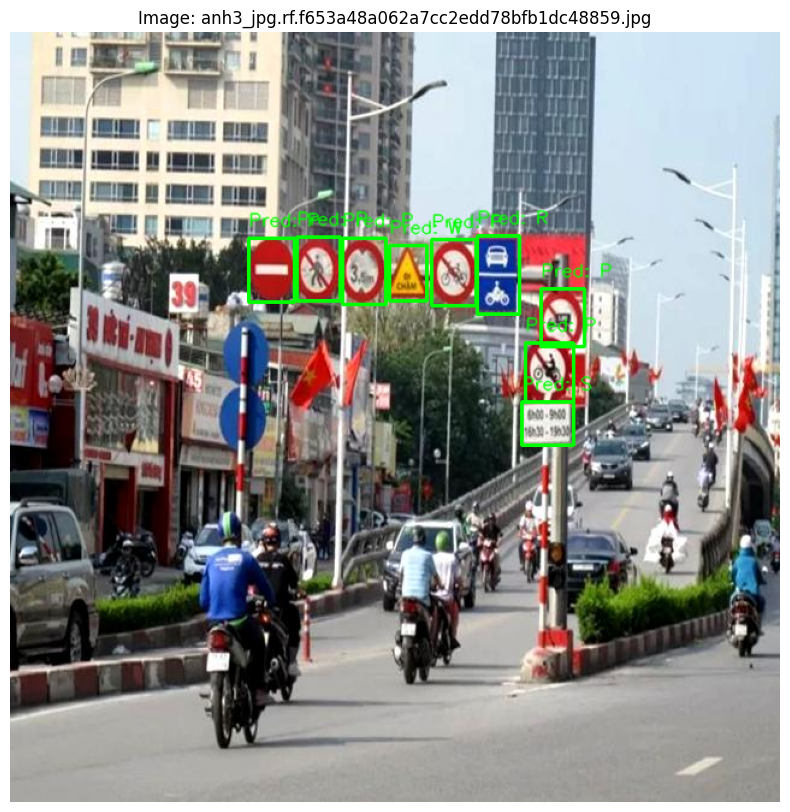

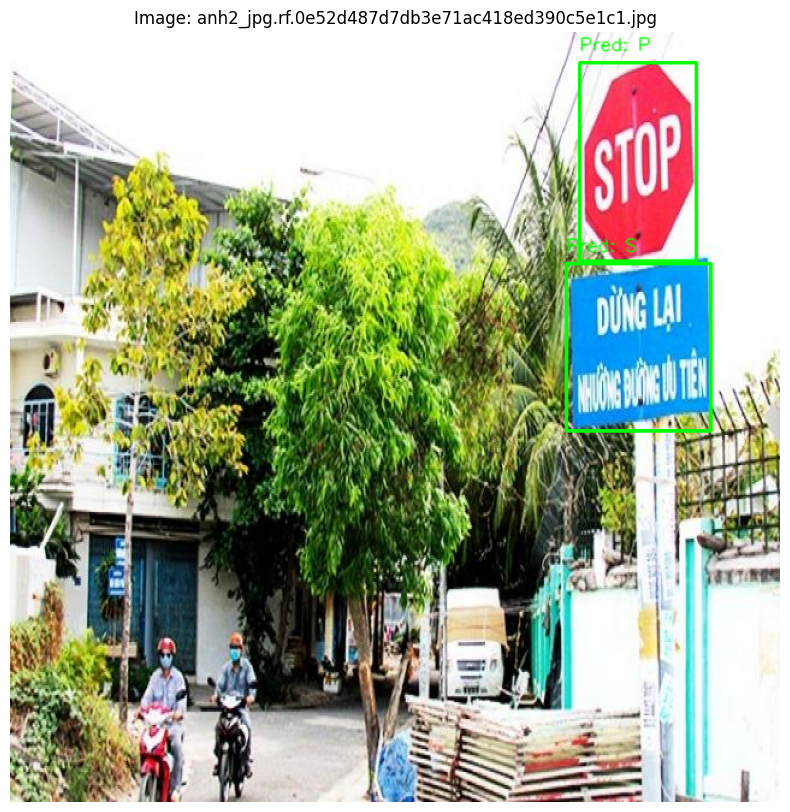

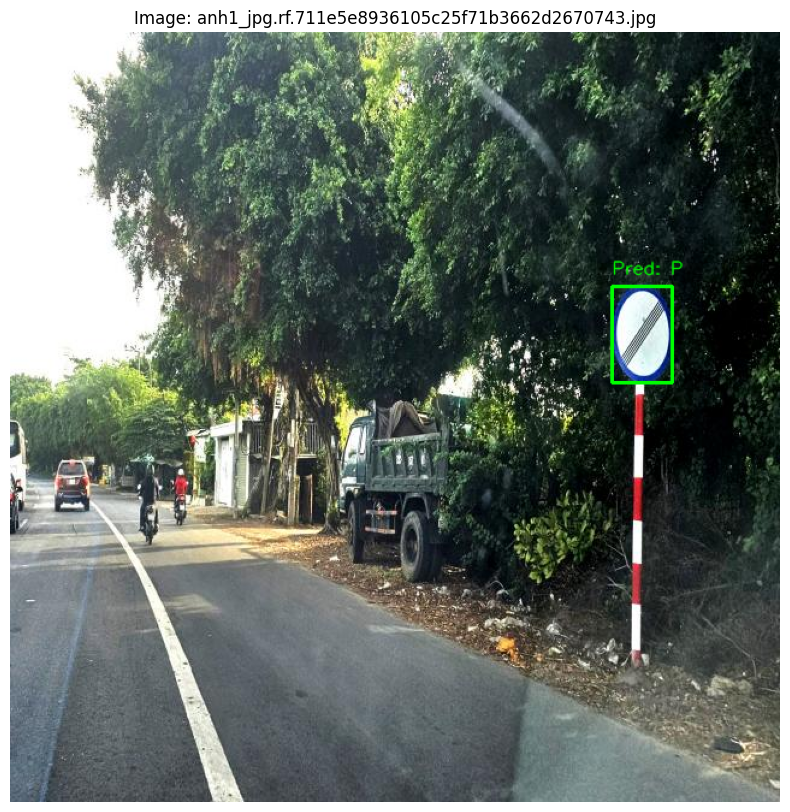

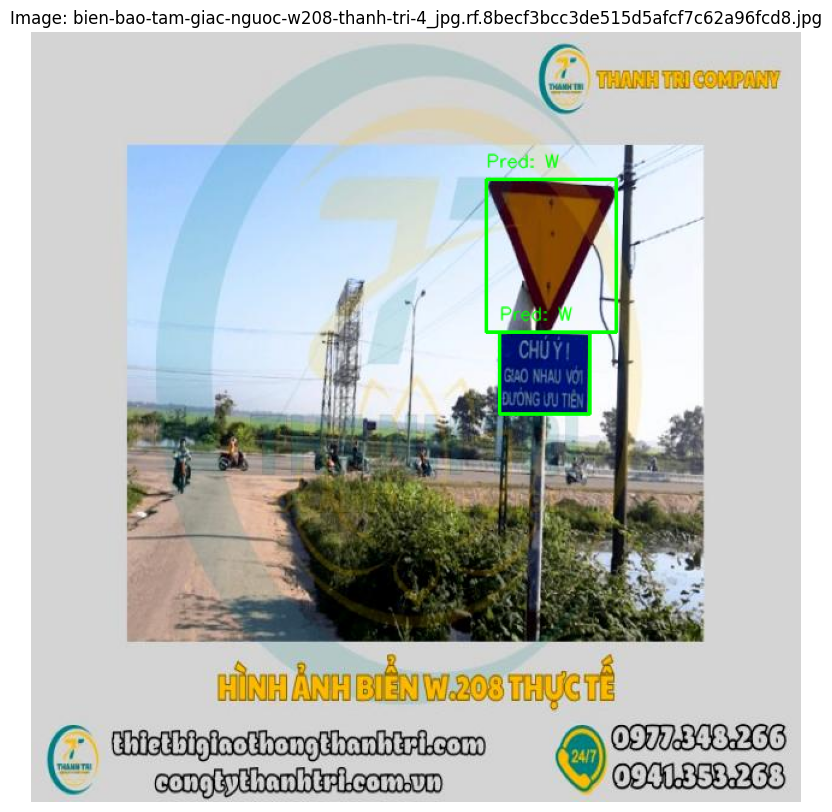

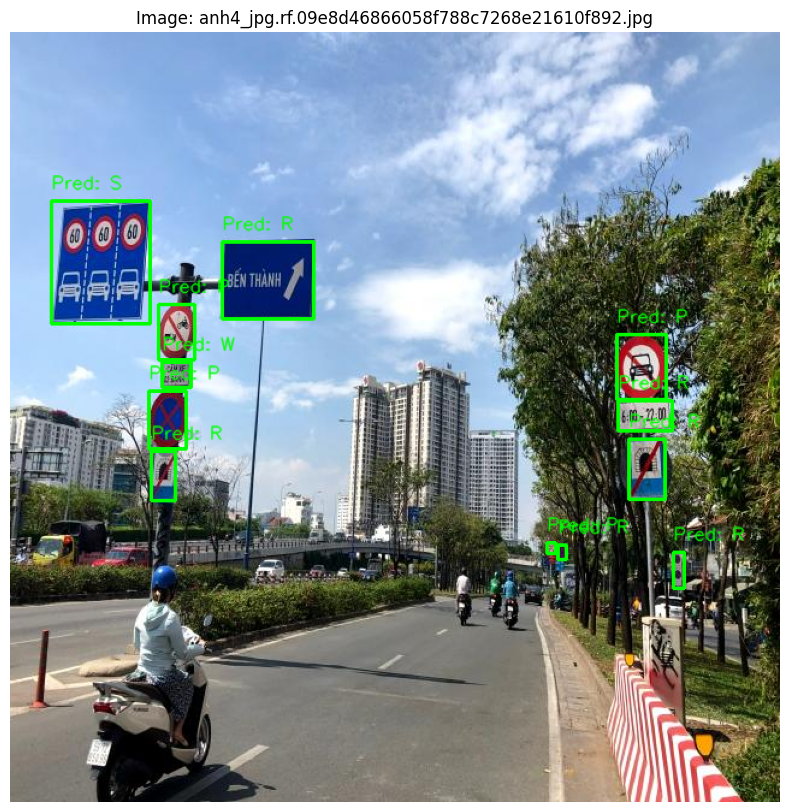

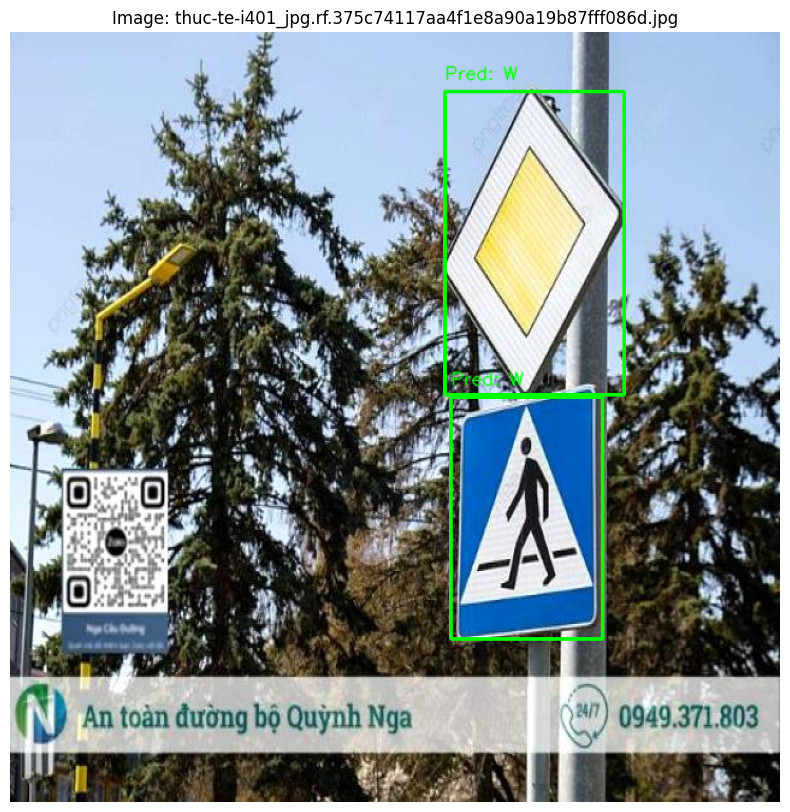

In [18]:
predict_new_images(rf, "C:\\Users\\Dong Hung\\Dataset\\BienBaoLe", "C:\\Users\\Dong Hung\\Dataset\\BienBaoLe\\_annotations.coco.json", id_to_label)

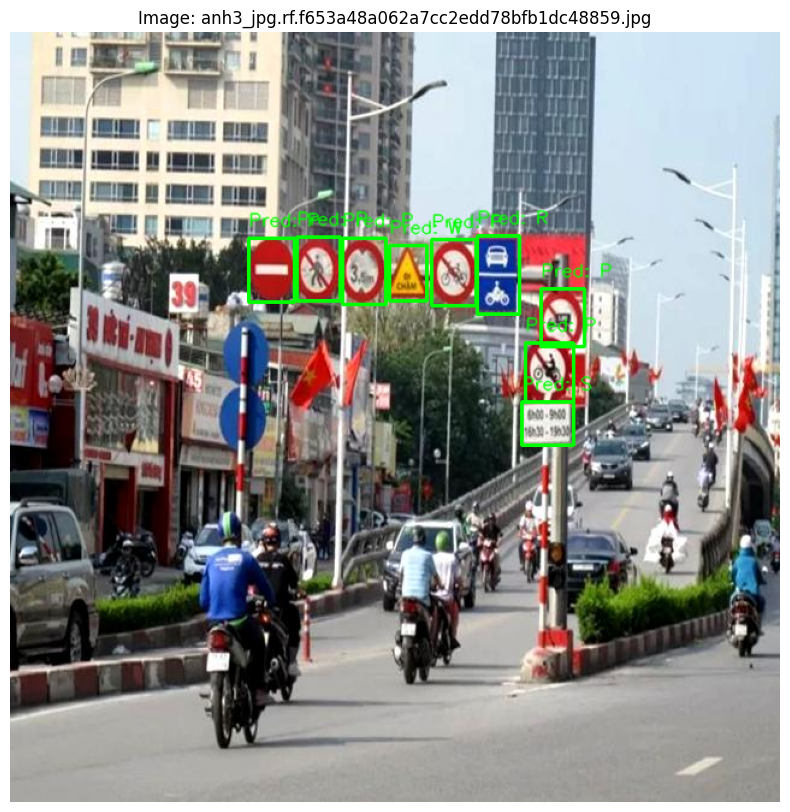

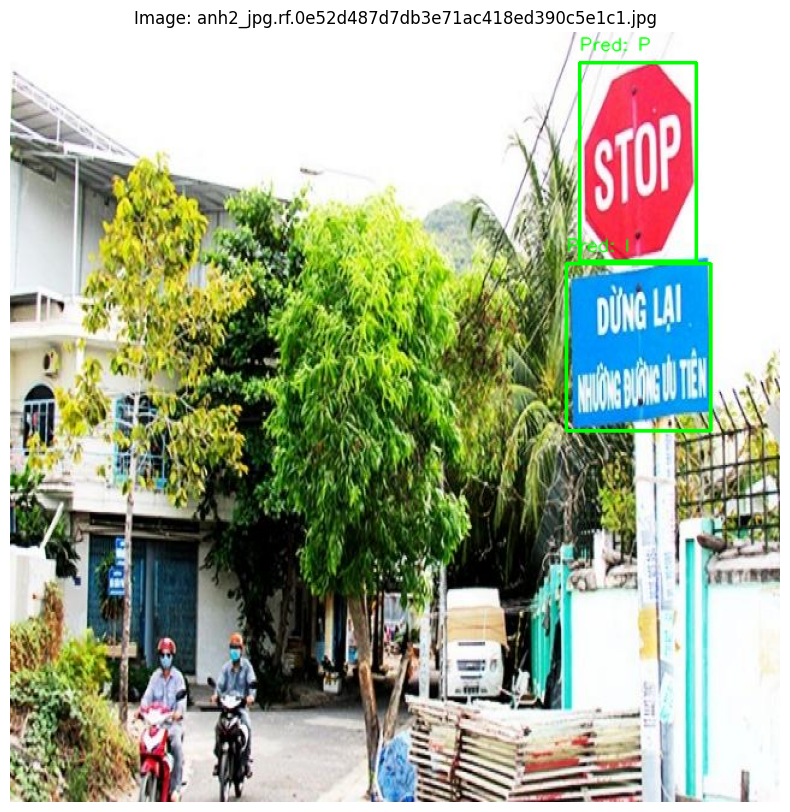

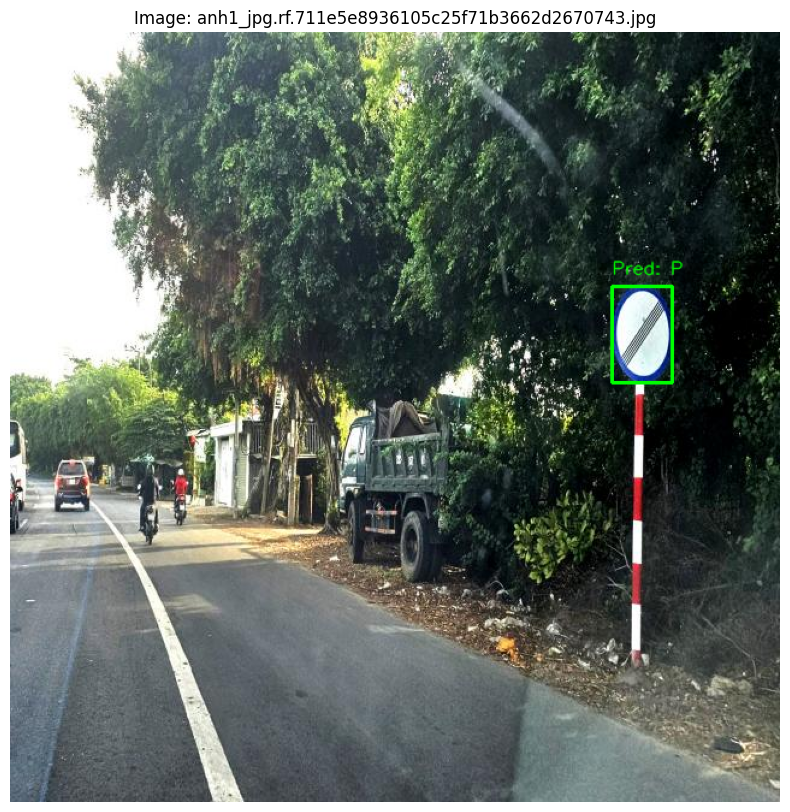

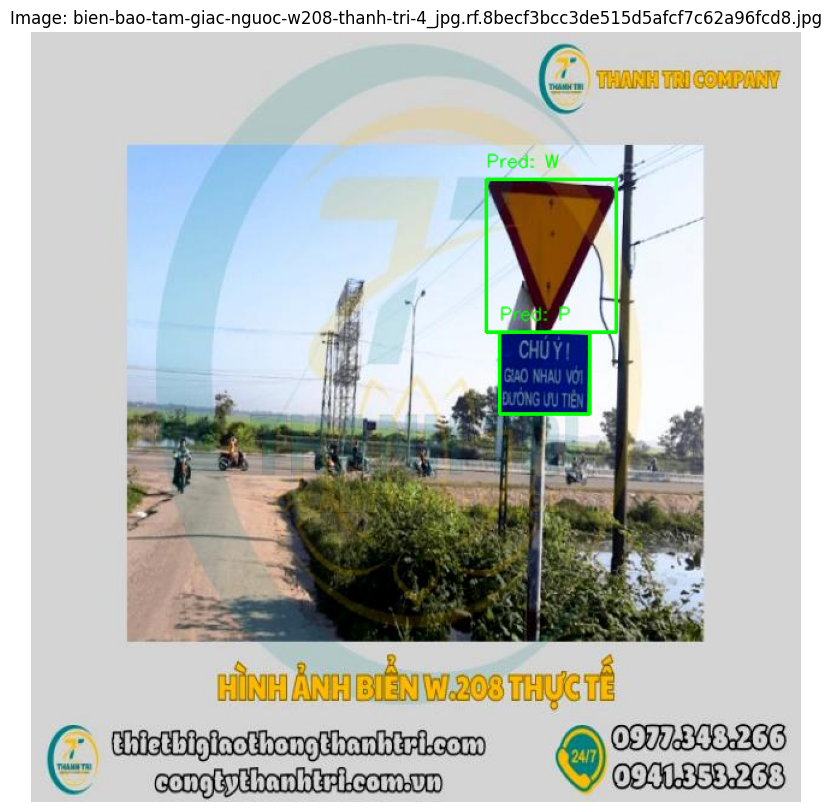

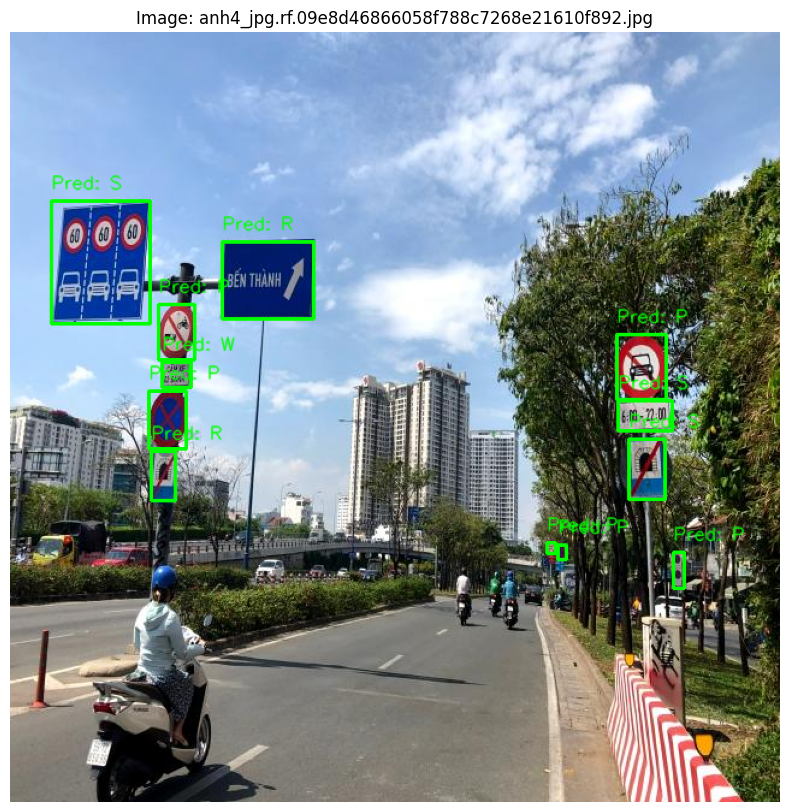

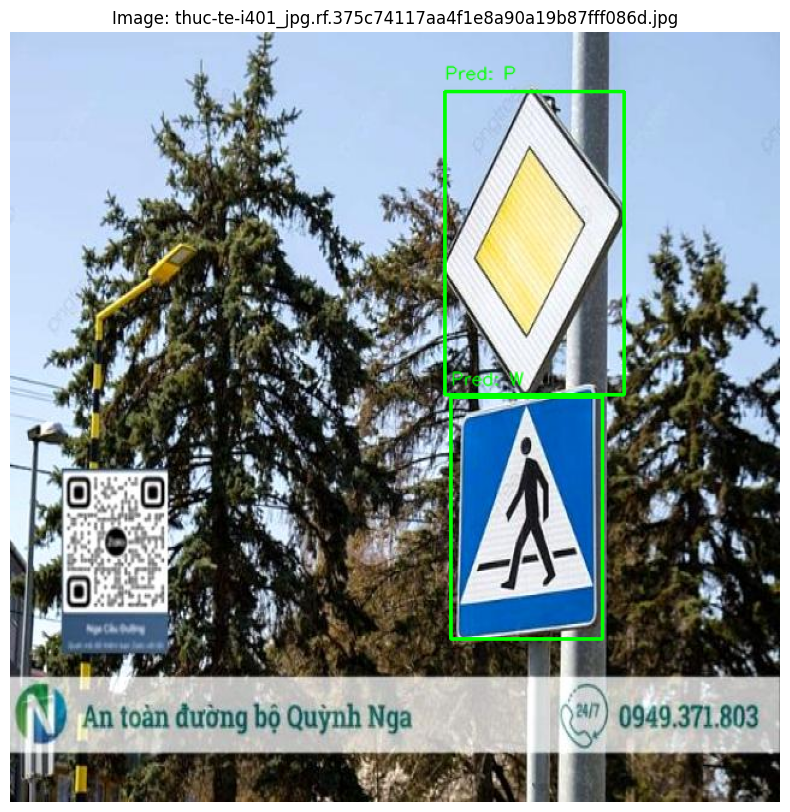

In [19]:
predict_new_images(svm, "C:\\Users\\Dong Hung\\Dataset\\BienBaoLe", "C:\\Users\\Dong Hung\\Dataset\\BienBaoLe\\_annotations.coco.json", id_to_label)

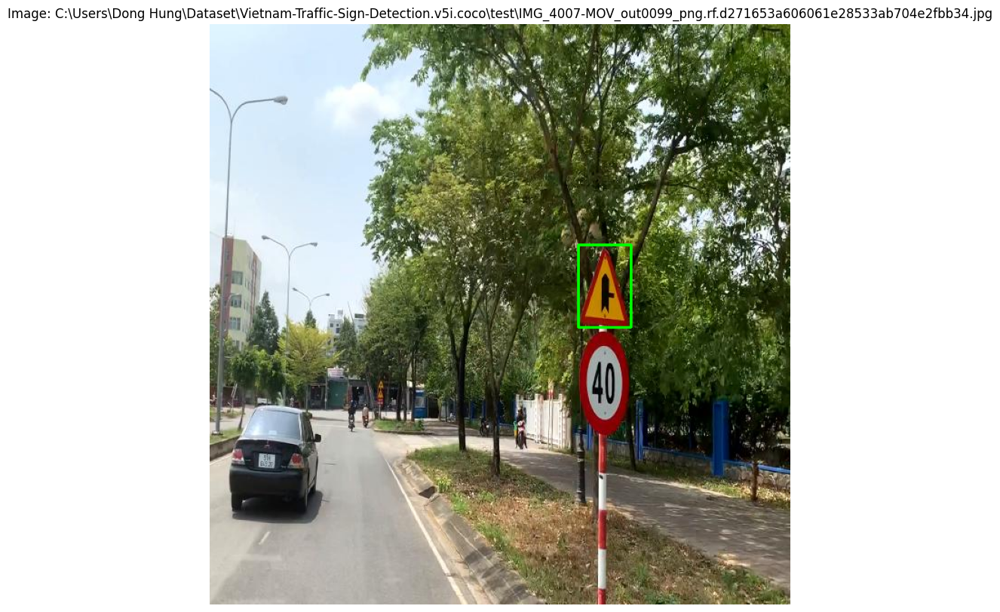

Predicted Label: W


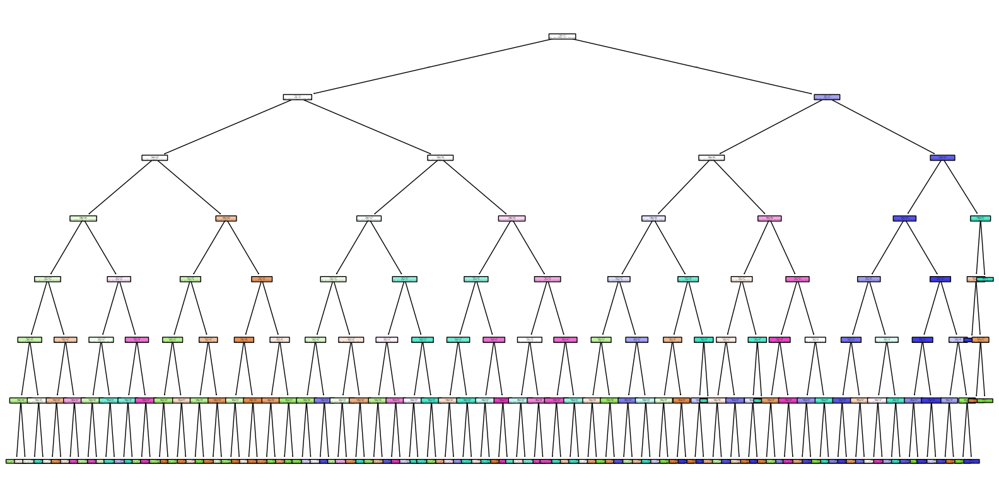

In [21]:
from sklearn.tree import plot_tree
def predict_and_plot_tree_for_image(model, image_path, bbox, extract_features_func):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Không thể đọc ảnh: {image_path}")
        return
    
    # Hiển thị ảnh với bounding box
    x, y, w, h = [int(coord) for coord in bbox]
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Khung màu xanh
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Hiển thị ảnh
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.title(f"Image: {image_path}")
    plt.axis("off")
    plt.show()
    
    # Trích xuất đặc trưng từ ảnh và bounding box
    features = extract_features_func(image, bbox)

    # Dự đoán nhãn cho đặc trưng
    predicted_label = model.predict([features])[0]
    predicted_label_name = id_to_label.get(predicted_label, "Unknown")
    print(f"Predicted Label: {predicted_label_name}")
    tree_index = 0
    # Chọn cây quyết định trong rừng Random Forest
    tree = model.estimators_[tree_index]
    
    # Vẽ cây quyết định
    plt.figure(figsize=(20, 10))
    plot_tree(tree, filled=True, feature_names=None, class_names=list(id_to_label.values()), rounded=True, proportion=False)
    plt.show()

# Ví dụ sử dụng hàm:
image_path = "C:\\Users\\Dong Hung\\Dataset\\Vietnam-Traffic-Sign-Detection.v5i.coco\\test\\IMG_4007-MOV_out0099_png.rf.d271653a606061e28533ab704e2fbb34.jpg"  # Đường dẫn ảnh của bạn
bbox = [406, 243, 58, 91.5]
predict_and_plot_tree_for_image(rf, image_path, bbox, extract_features_with_hog)


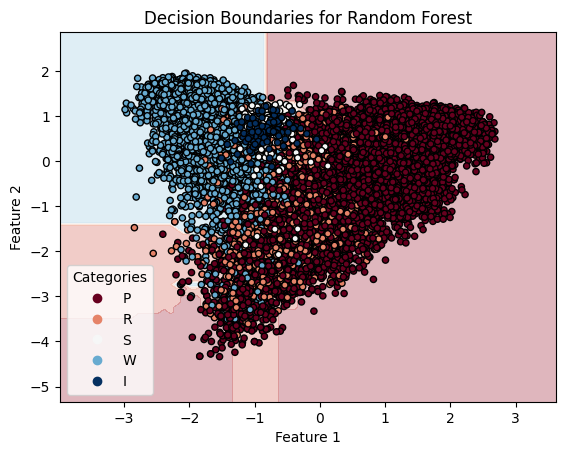

In [22]:
def plot_decision_boundary_rf(X, y, model, pca_components=2, cmap='RdBu'):
    # Kiểm tra nếu số chiều của X > pca_components, nếu có thì giảm chiều xuống 2D
    if X.shape[1] > pca_components:
        pca = PCA(n_components=pca_components)
        X_reduced = pca.fit_transform(X)  # Giảm chiều xuống 2 chiều
    else:
        X_reduced = X  # Nếu đã là 2D, không cần giảm chiều

    # Huấn luyện lại mô hình RandomForest với dữ liệu đã giảm chiều
    model.fit(X_reduced, y)

    # Tạo lưới các điểm trong không gian 2 chiều
    x_min, x_max = np.min(X_reduced[:, 0]) - 1, np.max(X_reduced[:, 0]) + 1
    y_min, y_max = np.min(X_reduced[:, 1]) - 1, np.max(X_reduced[:, 1]) + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))

    # Dự đoán lớp cho mỗi điểm trong lưới
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Vẽ các đường biên
    plt.contourf(xx, yy, Z, cmap=cmap, alpha=0.3)

    # Vẽ dữ liệu huấn luyện
    scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap=cmap, edgecolors='k', s=20)

    # Tạo legend cho các lớp
    unique_labels = np.unique(y)
    plt.legend(handles=scatter.legend_elements()[0],
                labels=[id_to_label[i] for i in sorted(id_to_label.keys())],
                title="Categories", loc="best")    
    # Cấu hình đồ thị
    plt.title("Decision Boundaries for Random Forest")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.show()

# Giả sử bạn đã có dữ liệu X_train, y_train
# Bạn sẽ giảm chiều của X_train về 2 chiều, sau đó huấn luyện mô hình RandomForest

pca = PCA(n_components=2)
X_train_reduced = pca.fit_transform(X_train)  # Giảm chiều xuống 2 chiều

# Huấn luyện mô hình RandomForest với dữ liệu đã giảm chiều
model = RandomForestClassifier(n_estimators=150, max_depth=7, min_samples_split=2, min_samples_leaf=1, random_state=42)
model.fit(X_train_reduced, y_train)

# Vẽ đường biên
plot_decision_boundary_rf(X_train, y_train, rf)

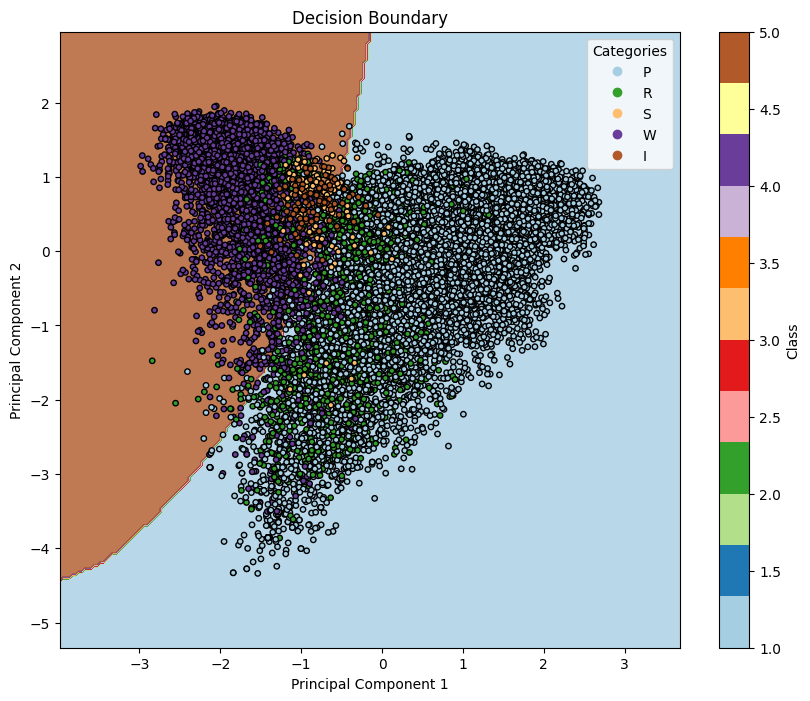

In [23]:
def plot_decision_boundary_svm(svm, X, y, category_mapping, title="Decision Boundary"):
    # Giảm số chiều từ 1764 xuống 2 bằng PCA
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)

    # Tạo lưới điểm trong không gian 2D của PCA
    x_min, x_max = X_reduced[:, 0].min() - 1, X_reduced[:, 0].max() + 1
    y_min, y_max = X_reduced[:, 1].min() - 1, X_reduced[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    
    # Lưới dữ liệu trong không gian PCA cần chuyển ngược về không gian gốc
    grid = np.c_[xx.ravel(), yy.ravel()]
    grid_original = pca.inverse_transform(grid)

    # Dự đoán lớp trên lưới dữ liệu
    Z = svm.predict(grid_original)
    Z = Z.reshape(xx.shape)

    # Vẽ đường biên quyết định
    plt.figure(figsize=(10, 8))
    plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.Paired)

    # Vẽ dữ liệu huấn luyện trong không gian 2D của PCA
    scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap=plt.cm.Paired, edgecolor='k', s=15)
    plt.legend(handles=scatter.legend_elements()[0],
               labels=[category_mapping[i] for i in sorted(category_mapping.keys())],
               title="Categories", loc="best")

    # Tùy chỉnh đồ thị
    plt.title(title)
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.colorbar(scatter, label="Class")
    plt.show()

plot_decision_boundary_svm(svm, X_train, y_train, id_to_label)